# Evaluate Unit-wget model over MPI and Era

This notebook evaluates different CNN autoencoder models on things like 1) monthly averages and 2) climate. The selected model tries to bias correct Mpi to Era and Era to MPI.

### TOC
 [1. Model Select](#ms)<br>
 [2. Load data](#ld)<br>
 [3. Month averages](#ma)<br>
 [4. Single day bias](#sd)<br>
 [5. Single filter activations](#sfa)<br>
 [6. Quantile plots](#qp)<br>
 





In [229]:
NN = 365
err1_list = []   # deviation from bottle neck mean
err2_list = []
for ff in range(NN):
    print(ff)
#     fig, axarr = plt.subplots(1, 4, figsize = (5,5))
#     plot = axarr[0].imshow(encoded.detach().numpy()[0,ff,::-1,:])
#     plot = axarr[1].imshow((encoded.detach().numpy()-bn_mean_mpi.numpy())[0,ff,::-1,:])
#     plot = axarr[2].imshow(bn_mean_mpi.detach().numpy()[0,ff,::-1,:])
#     plot = axarr[3].imshow((bn_mean_mpi.detach().numpy()-encoded.numpy())[0,ff,::-1,:])
#     plt.show()
    
    # col3
    newbn = encoded.clone()
    newbn[0,ff,:,:] = bn_mean_mpi[0,ff,:,:].clone()
    generated_chunk = gen_a.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]
    err = float(mae(torch.tensor(generated_chunk_denorm), torch.tensor(front_decoded_denorm)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(front_decoded_denorm[ii])).detach())) for ii in range(18)]
    #err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    #err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]
    print('avg err:', err)
    print('err18:', err18)
    err1_list.append([err, err18, ff, generated_chunk_denorm - front_decoded_denorm])
    svars=[8,9,10,11,12,13,14,15]
    #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
    
    
    # col4
    newbn = bn_mean_mpi.clone()
    newbn[0,ff,:,:] = encoded[0,ff,:,:].clone()
    generated_chunk = gen_a.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]
    err = float(mae(torch.tensor(generated_chunk_denorm), torch.tensor(avg_decoded_denorm)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk_denorm[ii]), torch.tensor(avg_decoded_denorm[ii])).detach())) for ii in range(18)]
    #err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(avg_decoded)).detach())
    #err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(avg_decoded[ii])).detach())) for ii in range(18)]
    print('front err', err)
    print('err18:', err18)
    err2_list.append([err, err18, ff, generated_chunk_denorm - avg_decoded_denorm])
    svars=[8,9,10,11,12,13,14,15]
    #plot_8v_abs_surf_192x256(np.array(generated_chunk), 'Surf: a2a (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)
                         

0
avg err: 0.01992450593262955
err18: [0.00145, 0.00178, 4.56e-07, 0.000963, 0.0163, 0.0195, 0.00309, 0.00318, 0.000286, 0.00429, 0.00434, 0.00204, 0.00384, 1.85e-06, 0.0251, 0.272, 1.9e-05, 4.26e-05]
front err 0.018182722700800503
err18: [0.00108, 0.00131, 7.68e-07, 0.0012, 0.0166, 0.0204, 0.00343, 0.00462, 0.000559, 0.00447, 0.00406, 0.00227, 0.00424, 1.3e-06, 0.0367, 0.226, 2.09e-05, 4.5e-05]
1
avg err: 0.01602313826823597
err18: [0.00221, 0.00261, 7.51e-07, 0.00229, 0.0229, 0.0227, 0.00836, 0.00356, 0.00021, 0.00381, 0.00339, 0.00472, 0.00438, 1.9e-06, 0.0338, 0.173, 1.34e-05, 4.79e-05]
front err 0.01963791129639992
err18: [0.00258, 0.00358, 9.53e-07, 0.00176, 0.0218, 0.0206, 0.00518, 0.0069, 0.000911, 0.00459, 0.00418, 0.00393, 0.00394, 1.59e-06, 0.0436, 0.23, 1.47e-05, 5.84e-05]
2
avg err: 0.09818476433835695
err18: [0.0351, 0.0256, 6.1e-06, 0.0189, 0.136, 0.131, 0.0607, 0.0211, 0.00333, 0.0442, 0.0434, 0.0167, 0.0423, 2.07e-05, 0.204, 0.984, 8.56e-05, 0.000473]
front err 0.10038

front err 0.14878355380274685
err18: [0.0271, 0.0431, 1.97e-05, 0.0361, 0.412, 0.703, 0.0592, 0.26, 0.00592, 0.0235, 0.0293, 0.0136, 0.0252, 1.54e-05, 0.252, 0.788, 0.000127, 0.000401]
22
avg err: 0.02093547561163519
err18: [0.000982, 0.00147, 7.01e-07, 0.000824, 0.025, 0.0238, 0.00614, 0.00556, 0.000188, 0.00343, 0.00315, 0.0012, 0.00218, 1.4e-06, 0.0217, 0.281, 8.97e-06, 4.37e-05]
front err 0.01982546629019982
err18: [0.0014, 0.00242, 9.32e-07, 0.00187, 0.0138, 0.0206, 0.00516, 0.00434, 0.000436, 0.00234, 0.00221, 0.00145, 0.00271, 1.05e-06, 0.0339, 0.264, 1.3e-05, 5.09e-05]
23
avg err: 0.25854239291939546
err18: [0.0184, 0.0137, 6.61e-06, 0.0147, 0.223, 0.24, 0.0776, 0.0273, 0.00317, 0.0866, 0.082, 0.0151, 0.0165, 4.27e-05, 0.763, 3.07, 0.000109, 0.00311]
front err 0.37102082816355714
err18: [0.0328, 0.0191, 2.31e-05, 0.0376, 0.606, 0.811, 0.054, 0.0376, 0.00798, 0.266, 0.233, 0.026, 0.0303, 9.52e-05, 2.27, 2.24, 0.00033, 0.0097]
24
avg err: 0.06256642152378397
err18: [0.0289, 0.01,

front err 0.19198105030267268
err18: [0.0176, 0.0448, 7.13e-06, 0.0457, 0.686, 1.01, 0.0685, 0.208, 0.00357, 0.0322, 0.0285, 0.023, 0.0239, 8.88e-06, 0.321, 0.947, 0.000145, 0.000462]
44
avg err: 0.3261147463161244
err18: [0.0313, 0.0403, 2.14e-05, 0.0253, 0.337, 0.434, 0.107, 0.0473, 0.0178, 0.0756, 0.0725, 0.0436, 0.0553, 4.21e-05, 1.83, 2.76, 0.000213, 0.000725]
front err 0.2421522577094646
err18: [0.0349, 0.0274, 1.71e-05, 0.0183, 0.266, 0.34, 0.134, 0.0442, 0.0242, 0.0763, 0.0711, 0.0562, 0.0752, 3.01e-05, 1.24, 1.95, 0.000219, 0.000873]
45
avg err: 0.036312518278980195
err18: [0.00505, 0.00344, 8.87e-07, 0.00424, 0.0529, 0.0877, 0.00567, 0.0127, 0.000391, 0.00574, 0.00487, 0.00228, 0.00388, 2.45e-06, 0.0498, 0.415, 1.31e-05, 8.66e-05]
front err 0.03449619580934682
err18: [0.00557, 0.00324, 1.07e-06, 0.00391, 0.0542, 0.0799, 0.0105, 0.0134, 0.000973, 0.00766, 0.00749, 0.00345, 0.00364, 3.05e-06, 0.0718, 0.355, 2.21e-05, 7.73e-05]
46
avg err: 0.07191091426027009
err18: [0.00646, 0.

front err 0.18871159059761475
err18: [0.0134, 0.0146, 4.74e-06, 0.0101, 0.158, 0.192, 0.0226, 0.0236, 0.00187, 0.0262, 0.0224, 0.0193, 0.023, 8.21e-06, 0.203, 2.67, 0.000149, 0.000528]
66
avg err: 0.13152337275532158
err18: [0.0122, 0.02, 4.57e-06, 0.00842, 0.117, 0.174, 0.0171, 0.0365, 0.00114, 0.0203, 0.019, 0.0117, 0.0151, 8.18e-06, 0.171, 1.74, 8.9e-05, 0.000201]
front err 0.10412279973426908
err18: [0.0166, 0.0349, 5.73e-06, 0.00877, 0.11, 0.138, 0.0159, 0.0263, 0.00377, 0.0246, 0.0217, 0.0142, 0.0194, 9.27e-06, 0.325, 1.11, 7.37e-05, 0.000362]
67
avg err: 0.01120883276250214
err18: [0.00112, 0.00105, 2.43e-07, 0.000775, 0.00677, 0.00738, 0.00265, 0.00394, 0.000151, 0.00179, 0.00179, 0.0013, 0.00124, 8e-07, 0.0153, 0.156, 6.59e-06, 2.3e-05]
front err 0.0097780196378616
err18: [0.00148, 0.00156, 5.6e-07, 0.000566, 0.00738, 0.00864, 0.00206, 0.00384, 0.000289, 0.00183, 0.0017, 0.0015, 0.00207, 7.04e-07, 0.0258, 0.117, 7.44e-06, 3.47e-05]
68
avg err: 0.366274237286678
err18: [0.104, 

front err 0.30947270508789426
err18: [0.026, 0.0221, 2.14e-05, 0.0241, 0.308, 0.198, 0.0473, 0.0817, 0.0749, 0.1, 0.0972, 0.067, 0.0518, 6.04e-05, 1.12, 3.36, 0.000252, 0.000667]
88
avg err: 0.012297937564518358
err18: [0.00172, 0.00116, 7.58e-07, 0.000647, 0.0143, 0.0143, 0.00269, 0.00288, 0.000172, 0.0019, 0.00184, 0.000973, 0.00185, 7.75e-07, 0.017, 0.16, 4.92e-06, 3.26e-05]
front err 0.012556988370223295
err18: [0.00146, 0.00172, 1e-06, 0.000743, 0.0106, 0.0144, 0.00298, 0.0024, 0.00057, 0.00354, 0.0033, 0.00141, 0.00126, 1.36e-06, 0.0257, 0.156, 9.18e-06, 5e-05]
89
avg err: 0.15742675854384675
err18: [0.0612, 0.0504, 5.63e-06, 0.0267, 0.299, 0.517, 0.0399, 0.0558, 0.00286, 0.038, 0.0275, 0.0141, 0.0159, 1.03e-05, 0.333, 1.35, 0.000113, 0.000501]
front err 0.15504461832501468
err18: [0.0586, 0.0501, 9.48e-06, 0.033, 0.356, 0.551, 0.0571, 0.069, 0.00475, 0.0395, 0.0314, 0.0161, 0.0165, 7.98e-06, 0.252, 1.25, 0.000189, 0.000707]
90
avg err: 0.25950103747218023
err18: [0.013, 0.0177, 

front err 0.15003362677744933
err18: [0.0114, 0.0382, 3.96e-06, 0.0177, 0.345, 0.476, 0.0362, 0.117, 0.00408, 0.0302, 0.0234, 0.0114, 0.0169, 8.61e-06, 0.178, 1.39, 0.000131, 0.000423]
110
avg err: 0.0729625784740181
err18: [0.00909, 0.00984, 1.97e-06, 0.00874, 0.0728, 0.0622, 0.0151, 0.0496, 0.00108, 0.0147, 0.0129, 0.00573, 0.0129, 6.37e-06, 0.121, 0.918, 4.46e-05, 0.000124]
front err 0.06199017952334688
err18: [0.0103, 0.00704, 2.79e-06, 0.00781, 0.0708, 0.0872, 0.0238, 0.0253, 0.00245, 0.0149, 0.0148, 0.00712, 0.0186, 6.97e-06, 0.143, 0.682, 5.71e-05, 0.000228]
111
avg err: 0.4769577805066356
err18: [0.0977, 0.171, 2.08e-05, 0.0887, 1.85, 1.71, 0.0746, 0.0511, 0.0122, 0.0721, 0.113, 0.0532, 0.052, 6.41e-05, 1.78, 2.46, 0.000264, 0.000612]
front err 0.4092912524377368
err18: [0.0402, 0.149, 1.46e-05, 0.0439, 1.51, 1.58, 0.0732, 0.0634, 0.0217, 0.0642, 0.0786, 0.0585, 0.0527, 3.85e-05, 0.971, 2.66, 0.000248, 0.000619]
112
avg err: 0.1861919757522671
err18: [0.0175, 0.0312, 2.75e-05, 

front err 0.19611747329996423
err18: [0.0295, 0.0483, 8.47e-06, 0.0382, 0.145, 0.383, 0.0397, 0.0471, 0.00875, 0.0814, 0.0765, 0.121, 0.0312, 3.46e-05, 0.559, 1.92, 0.000202, 0.000579]
132
avg err: 0.2741895428237331
err18: [0.0778, 0.0286, 1.15e-05, 0.0346, 0.439, 0.634, 0.0482, 0.047, 0.00509, 0.0474, 0.0415, 0.0263, 0.0596, 1.99e-05, 0.51, 2.94, 8.23e-05, 0.00048]
front err 0.24529715220603826
err18: [0.0611, 0.0245, 1.02e-05, 0.0372, 0.249, 0.444, 0.0386, 0.0384, 0.014, 0.0556, 0.0376, 0.0319, 0.0661, 1.74e-05, 0.497, 2.82, 0.000161, 0.00074]
133
avg err: 0.07130122868286595
err18: [0.00603, 0.0036, 2.13e-06, 0.00248, 0.0864, 0.124, 0.00653, 0.00814, 0.00114, 0.0151, 0.0178, 0.00554, 0.00886, 1.03e-05, 0.14, 0.858, 3.94e-05, 0.000155]
front err 0.056391266479551026
err18: [0.00548, 0.00484, 1.85e-06, 0.00207, 0.0946, 0.12, 0.00759, 0.00708, 0.00166, 0.0116, 0.014, 0.00613, 0.00788, 6.5e-06, 0.109, 0.623, 5.49e-05, 0.000181]
134
avg err: 0.010498063817606963
err18: [0.00067, 0.00112

avg err: 0.06789769222465307
err18: [0.00952, 0.0126, 6.13e-06, 0.00369, 0.0444, 0.071, 0.0322, 0.0158, 0.000865, 0.014, 0.0131, 0.00672, 0.00675, 4.63e-06, 0.235, 0.756, 5.2e-05, 0.0002]
front err 0.07097049477515688
err18: [0.00769, 0.00941, 4.92e-06, 0.00867, 0.0785, 0.166, 0.0279, 0.0173, 0.00243, 0.0189, 0.0142, 0.00727, 0.01, 4.86e-06, 0.14, 0.769, 7.95e-05, 0.000349]
154
avg err: 0.44338839214799675
err18: [0.0614, 0.0582, 2.72e-05, 0.106, 0.609, 0.541, 0.318, 0.575, 0.0149, 0.0576, 0.0708, 0.0362, 0.0636, 4.01e-05, 2.01, 3.46, 0.000158, 0.000732]
front err 0.3774049586442093
err18: [0.0382, 0.0671, 1.66e-05, 0.104, 0.371, 1.04, 0.211, 0.361, 0.028, 0.0673, 0.0527, 0.0534, 0.0662, 2.3e-05, 1.26, 3.08, 0.000165, 0.00173]
155
avg err: 0.03551823793374484
err18: [0.00621, 0.00242, 7.32e-07, 0.00415, 0.0327, 0.05, 0.00991, 0.00831, 0.000507, 0.01, 0.00887, 0.00318, 0.00405, 3.27e-06, 0.0697, 0.429, 2.6e-05, 0.000124]
front err 0.03191358814145043
err18: [0.00467, 0.0024, 1.07e-06, 0

front err 0.028980122183071992
err18: [0.002, 0.00347, 7.53e-07, 0.00332, 0.0243, 0.0514, 0.00735, 0.0152, 0.000686, 0.0113, 0.011, 0.00524, 0.00503, 2.83e-06, 0.0542, 0.327, 0.000107, 0.000174]
175
avg err: 0.023877151299113244
err18: [0.0032, 0.00307, 8.71e-07, 0.0024, 0.0299, 0.0414, 0.00423, 0.00541, 0.000325, 0.00589, 0.00519, 0.00398, 0.0032, 2.35e-06, 0.039, 0.282, 1.26e-05, 5.51e-05]
front err 0.022787018750097934
err18: [0.00335, 0.00357, 1.1e-06, 0.00264, 0.0255, 0.0389, 0.0056, 0.00702, 0.00122, 0.00729, 0.00602, 0.00489, 0.00524, 2.44e-06, 0.0622, 0.237, 1.26e-05, 0.000105]
176
avg err: 0.20625807782270764
err18: [0.017, 0.0309, 6.8e-06, 0.0315, 0.214, 0.442, 0.181, 0.122, 0.00191, 0.0403, 0.0391, 0.0229, 0.0284, 1.63e-05, 0.424, 2.12, 9.34e-05, 0.000676]
front err 0.16536900536134252
err18: [0.0312, 0.0312, 9.67e-06, 0.0233, 0.194, 0.279, 0.113, 0.101, 0.00456, 0.0573, 0.0533, 0.0238, 0.0218, 1.84e-05, 0.431, 1.61, 0.000249, 0.00139]
177
avg err: 0.03359181275426792
err18:

avg err: 0.23829096849627474
err18: [0.0445, 0.0801, 1.28e-05, 0.0422, 0.723, 0.866, 0.23, 0.132, 0.00174, 0.0294, 0.0235, 0.0178, 0.0199, 1e-05, 0.297, 1.78, 8.56e-05, 0.000404]
front err 0.20051146979704357
err18: [0.0253, 0.0783, 9.79e-06, 0.0305, 0.497, 0.687, 0.18, 0.139, 0.00606, 0.032, 0.0327, 0.0171, 0.0293, 1.32e-05, 0.345, 1.51, 0.00013, 0.000419]
197
avg err: 0.4941278613232407
err18: [0.0263, 0.0575, 4.23e-05, 0.118, 0.584, 1.47, 0.0757, 0.173, 0.00605, 0.197, 0.176, 0.0374, 0.0339, 7.98e-05, 2.2, 3.73, 0.000426, 0.00731]
front err 0.6472706285405274
err18: [0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]
198
avg err: 0.06861189251615135
err18: [0.00658, 0.00838, 2.41e-06, 0.00397, 0.059, 0.0755, 0.0159, 0.0163, 0.000739, 0.0108, 0.00998, 0.00498, 0.00562, 5.21e-06, 0.0806, 0.936, 3.07e-05, 0.000169]
front err 0.06973973097305215
err18: [0.00844, 0.00667, 2.94e-06, 0.0039, 0.0797, 0.0957

front err 0.027961557059325255
err18: [0.00303, 0.00477, 8.92e-07, 0.00233, 0.0455, 0.0556, 0.00865, 0.0119, 0.000715, 0.00761, 0.00744, 0.00337, 0.00368, 2.91e-06, 0.0534, 0.295, 2.96e-05, 0.000163]
218
avg err: 0.08018616688372615
err18: [0.0218, 0.00859, 5.75e-06, 0.0119, 0.0737, 0.12, 0.0267, 0.0189, 0.00295, 0.0166, 0.0153, 0.0175, 0.0222, 6.13e-06, 0.244, 0.843, 9.63e-05, 0.000183]
front err 0.06558948838876011
err18: [0.0158, 0.00605, 3.69e-06, 0.00721, 0.104, 0.105, 0.0175, 0.0235, 0.00537, 0.0199, 0.0235, 0.019, 0.03, 1.06e-05, 0.17, 0.634, 0.000101, 0.000362]
219
avg err: 0.20291032723002672
err18: [0.0245, 0.0193, 9.19e-06, 0.00937, 0.228, 0.213, 0.0386, 0.074, 0.00369, 0.0536, 0.0481, 0.0256, 0.0187, 2.43e-05, 0.438, 2.46, 0.000174, 0.0011]
front err 0.1691336812967058
err18: [0.019, 0.0193, 4.72e-06, 0.023, 0.237, 0.372, 0.0302, 0.0758, 0.00728, 0.0713, 0.0673, 0.0238, 0.0215, 2.87e-05, 0.57, 1.5, 0.000271, 0.00186]
220
avg err: 0.23421847723798278
err18: [0.019, 0.0361, 1

front err 0.2122403412947948
err18: [0.0252, 0.0172, 5.55e-06, 0.0207, 0.169, 0.251, 0.0223, 0.059, 0.00835, 0.0995, 0.081, 0.0338, 0.0236, 2.77e-05, 0.554, 2.45, 0.000512, 0.0027]
240
avg err: 0.24502345695640593
err18: [0.0614, 0.103, 3.64e-05, 0.054, 0.361, 0.496, 0.172, 0.238, 0.0102, 0.05, 0.0485, 0.0196, 0.0303, 2.77e-05, 0.958, 1.81, 0.000115, 0.000395]
front err 0.2608663061635438
err18: [0.0459, 0.102, 2.7e-05, 0.0281, 0.28, 0.298, 0.128, 0.222, 0.0213, 0.0561, 0.042, 0.0249, 0.0401, 2.04e-05, 0.63, 2.78, 0.000146, 0.000485]
241
avg err: 0.16348544272600032
err18: [0.0255, 0.0142, 3.14e-05, 0.034, 0.234, 0.597, 0.0363, 0.0344, 0.00227, 0.0315, 0.0232, 0.015, 0.0257, 1.03e-05, 0.519, 1.35, 8.23e-05, 0.000303]
front err 0.14189170134808837
err18: [0.0187, 0.0159, 1.23e-05, 0.0148, 0.166, 0.237, 0.0983, 0.023, 0.00487, 0.0352, 0.0273, 0.0146, 0.0361, 9.61e-06, 0.349, 1.51, 0.000132, 0.000323]
242
avg err: 0.03317369227670471
err18: [0.00262, 0.00384, 2.38e-06, 0.00602, 0.036, 0.0

front err 0.1917564301286974
err18: [0.0255, 0.00962, 4.99e-06, 0.0167, 0.0902, 0.237, 0.0284, 0.0164, 0.00398, 0.0658, 0.063, 0.0284, 0.0277, 1.6e-05, 0.374, 2.46, 0.000543, 0.00114]
262
avg err: 0.01779159640039948
err18: [0.00172, 0.00168, 9.4e-07, 0.00131, 0.0125, 0.0231, 0.00497, 0.00345, 0.000182, 0.00332, 0.00286, 0.00162, 0.00141, 1.43e-06, 0.0396, 0.222, 9.41e-06, 6.09e-05]
front err 0.02309374417125433
err18: [0.00173, 0.00235, 9.43e-07, 0.00179, 0.0194, 0.0308, 0.00472, 0.00313, 0.000631, 0.00382, 0.00335, 0.00189, 0.00253, 1.42e-06, 0.0648, 0.275, 1.76e-05, 0.000102]
263
avg err: 0.02161067824140676
err18: [0.00222, 0.0045, 6.66e-07, 0.00142, 0.021, 0.0223, 0.00454, 0.0052, 0.000221, 0.0058, 0.00508, 0.00203, 0.00222, 2.12e-06, 0.0281, 0.284, 1.18e-05, 6.28e-05]
front err 0.01844812154238977
err18: [0.00287, 0.00323, 9.09e-07, 0.0012, 0.0163, 0.0227, 0.00387, 0.00572, 0.000613, 0.0051, 0.00439, 0.0024, 0.00246, 1.6e-06, 0.0338, 0.227, 1.75e-05, 6.54e-05]
264
avg err: 0.1703

avg err: 0.0770586481344301
err18: [0.00664, 0.0156, 2.31e-06, 0.0047, 0.153, 0.171, 0.0313, 0.0374, 0.00103, 0.0102, 0.0101, 0.00793, 0.0214, 5.81e-06, 0.251, 0.666, 3.05e-05, 0.000109]
front err 0.06923532744804517
err18: [0.00699, 0.0257, 1.67e-06, 0.00517, 0.18, 0.184, 0.0166, 0.0511, 0.00271, 0.0178, 0.0151, 0.00954, 0.0294, 5.68e-06, 0.174, 0.528, 5.45e-05, 0.000272]
284
avg err: 0.054024920373420174
err18: [0.0041, 0.00329, 1.67e-06, 0.0026, 0.0431, 0.0563, 0.0112, 0.00682, 0.000573, 0.0113, 0.0104, 0.00464, 0.00461, 4.59e-06, 0.0537, 0.76, 5.43e-05, 0.00011]
front err 0.0460307876983695
err18: [0.00521, 0.00623, 1.56e-06, 0.0022, 0.0392, 0.047, 0.0138, 0.00588, 0.00118, 0.00724, 0.00695, 0.00446, 0.00478, 3.03e-06, 0.0943, 0.59, 3.33e-05, 0.000171]
285
avg err: 0.02084518772869657
err18: [0.00147, 0.00223, 1.45e-06, 0.00192, 0.0268, 0.0356, 0.00422, 0.00361, 0.0003, 0.00708, 0.00645, 0.00311, 0.0025, 2.34e-06, 0.0401, 0.24, 2.29e-05, 8.16e-05]
front err 0.023620431429631883
err

front err 0.044187326423531306
err18: [0.00337, 0.00627, 2.16e-06, 0.0038, 0.0652, 0.0599, 0.0223, 0.00984, 0.00213, 0.0138, 0.0132, 0.00598, 0.0173, 4.91e-06, 0.113, 0.459, 4.7e-05, 0.000218]
305
avg err: 0.14207290372965475
err18: [0.0183, 0.0409, 2.34e-05, 0.011, 0.26, 0.397, 0.132, 0.0626, 0.00184, 0.0253, 0.0244, 0.0183, 0.017, 9.06e-06, 0.272, 1.28, 0.000117, 0.000487]
front err 0.1279865746893119
err18: [0.0182, 0.0313, 1.48e-05, 0.00929, 0.258, 0.344, 0.105, 0.0237, 0.00486, 0.0417, 0.0335, 0.0225, 0.0263, 8.83e-06, 0.288, 1.1, 0.000202, 0.000712]
306
avg err: 0.02743562860843764
err18: [0.00224, 0.0085, 2.65e-06, 0.00283, 0.0295, 0.0379, 0.00611, 0.00734, 0.000326, 0.00438, 0.00397, 0.00223, 0.00296, 2.62e-06, 0.0426, 0.343, 1.18e-05, 7.19e-05]
front err 0.033333622879646745
err18: [0.00303, 0.00591, 1.95e-06, 0.00246, 0.0299, 0.0414, 0.00554, 0.0191, 0.000851, 0.00698, 0.00668, 0.00334, 0.00451, 2.98e-06, 0.0429, 0.427, 2.78e-05, 0.000131]
307
avg err: 0.1687176152925588
err1

front err 0.16312265056314373
err18: [0.0377, 0.0699, 1.27e-05, 0.0117, 0.19, 0.209, 0.131, 0.15, 0.00625, 0.0324, 0.0281, 0.0216, 0.0433, 1.12e-05, 0.299, 1.7, 0.000126, 0.000634]
327
avg err: 0.1716586440089076
err18: [0.0173, 0.0204, 1.15e-05, 0.0286, 0.338, 0.612, 0.0773, 0.022, 0.00155, 0.0609, 0.0501, 0.0167, 0.0106, 2.1e-05, 0.725, 1.11, 0.000116, 0.00233]
front err 0.24498671751614612
err18: [0.037, 0.0182, 2.05e-05, 0.0501, 0.439, 0.823, 0.0949, 0.0542, 0.0043, 0.172, 0.142, 0.0286, 0.0198, 5.51e-05, 1.67, 0.853, 0.000344, 0.00653]
328
avg err: 0.02569544481760315
err18: [0.00142, 0.00135, 6.89e-07, 0.00182, 0.0149, 0.0265, 0.00303, 0.00596, 0.000281, 0.00413, 0.00385, 0.00275, 0.00261, 1.53e-06, 0.0273, 0.367, 1.81e-05, 3.96e-05]
front err 0.025959949344222997
err18: [0.00162, 0.00176, 5.54e-07, 0.00251, 0.023, 0.0433, 0.00329, 0.00739, 0.000456, 0.00402, 0.00368, 0.00232, 0.00208, 1.36e-06, 0.0442, 0.328, 1.89e-05, 6.18e-05]
329
avg err: 0.029738843247911168
err18: [0.0026, 

avg err: 0.06044232717536641
err18: [0.00541, 0.00594, 3.98e-06, 0.00551, 0.0765, 0.0787, 0.0208, 0.0209, 0.00106, 0.0192, 0.017, 0.00759, 0.0125, 6.67e-06, 0.122, 0.694, 6.31e-05, 0.000203]
front err 0.05890317085990371
err18: [0.0065, 0.00496, 3.16e-06, 0.00561, 0.0498, 0.08, 0.0185, 0.0205, 0.00217, 0.0165, 0.0137, 0.0078, 0.0123, 4.46e-06, 0.128, 0.694, 7.2e-05, 0.000304]
349
avg err: 0.04802547199314174
err18: [0.0047, 0.00416, 1.27e-06, 0.00518, 0.0608, 0.0764, 0.0082, 0.014, 0.000933, 0.0222, 0.0191, 0.00579, 0.00787, 6.83e-06, 0.0972, 0.538, 4.79e-05, 0.000232]
front err 0.040906180180304764
err18: [0.00502, 0.00476, 1.28e-06, 0.00707, 0.0759, 0.0872, 0.0106, 0.015, 0.00136, 0.00974, 0.008, 0.00849, 0.00988, 2.7e-06, 0.105, 0.388, 4.01e-05, 0.000164]
350
avg err: 0.22601743295944138
err18: [0.0659, 0.057, 9.78e-06, 0.032, 0.494, 0.326, 0.0977, 0.0393, 0.0105, 0.0899, 0.0584, 0.0361, 0.0375, 1.61e-05, 0.692, 2.03, 0.000283, 0.000401]
front err 0.1950051173184305
err18: [0.0359, 

### Per-variable MSE

front, avg, front, avg


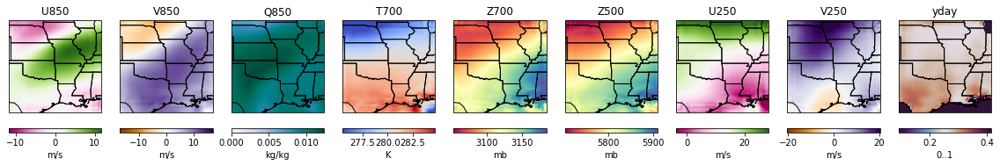

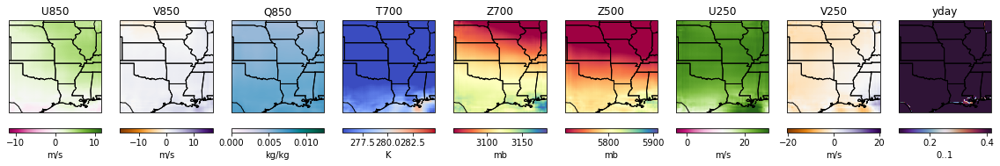

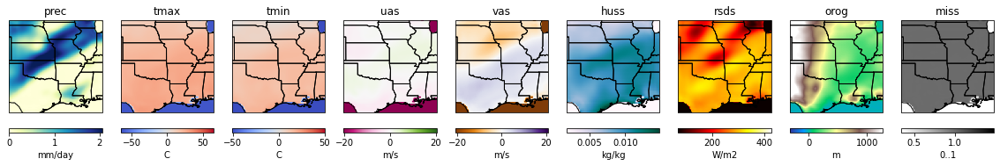

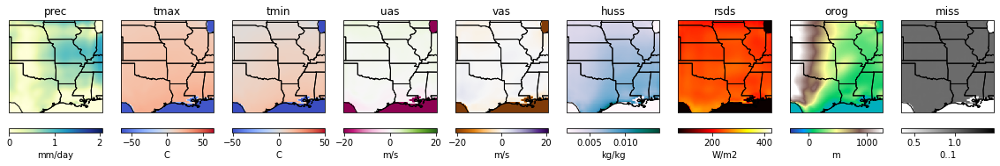

var, filter, err(var[ii]), tot_err: 0 323 0.435 1.59
[0.435, 0.411, 7.4e-05, 0.406, 9.97, 6.92, 0.876, 0.724, 0.0112, 0.127, 0.116, 0.0815, 0.107, 4.75e-05, 1.06, 7.32, 0.000614, 0.00213]


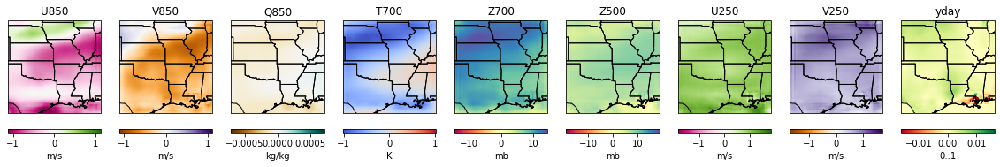

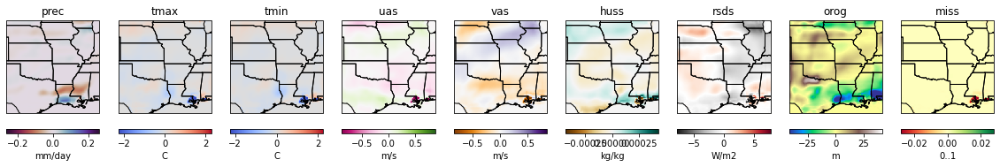

var, filter, err(var[ii]), tot_err: 1 156 0.423 0.454
[0.241, 0.423, 2.69e-05, 0.0799, 0.376, 0.726, 0.127, 0.22, 0.0135, 0.081, 0.0708, 0.0291, 0.0367, 3.89e-05, 1.52, 4.21, 0.000129, 0.000811]


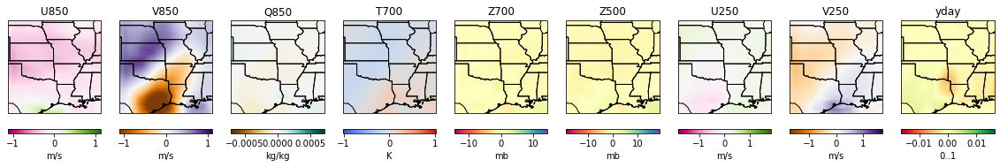

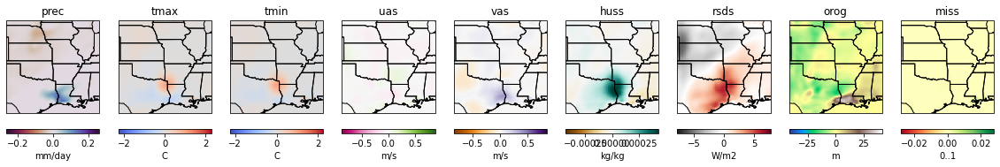

var, filter, err(var[ii]), tot_err: 2 250 0.000288 0.691
[0.111, 0.0592, 0.000288, 0.296, 0.563, 3.91, 0.18, 0.169, 0.0141, 0.129, 0.119, 0.0693, 0.0444, 7.34e-05, 0.922, 5.84, 0.000332, 0.00176]


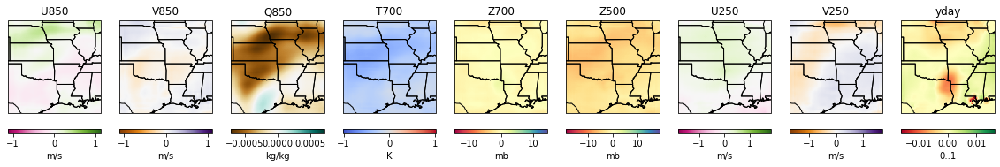

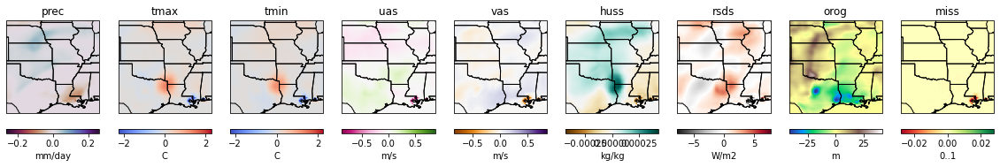

var, filter, err(var[ii]), tot_err: 3 323 0.406 1.59
[0.435, 0.411, 7.4e-05, 0.406, 9.97, 6.92, 0.876, 0.724, 0.0112, 0.127, 0.116, 0.0815, 0.107, 4.75e-05, 1.06, 7.32, 0.000614, 0.00213]


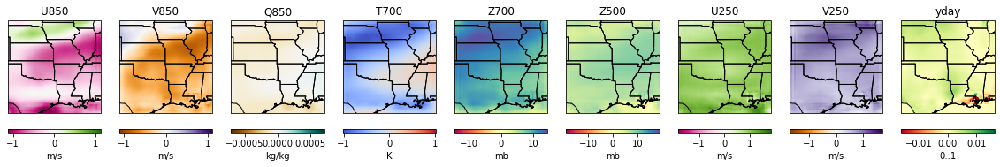

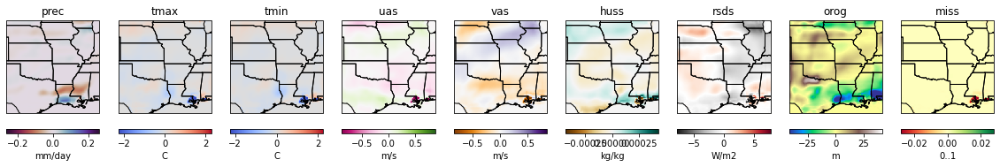

var, filter, err(var[ii]), tot_err: 4 323 9.97 1.59
[0.435, 0.411, 7.4e-05, 0.406, 9.97, 6.92, 0.876, 0.724, 0.0112, 0.127, 0.116, 0.0815, 0.107, 4.75e-05, 1.06, 7.32, 0.000614, 0.00213]


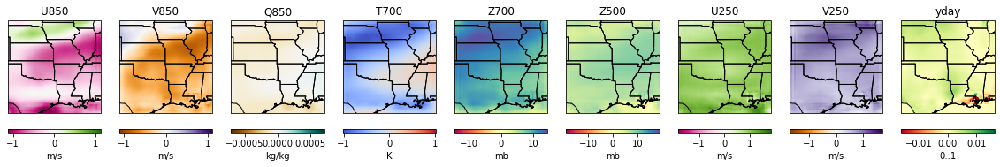

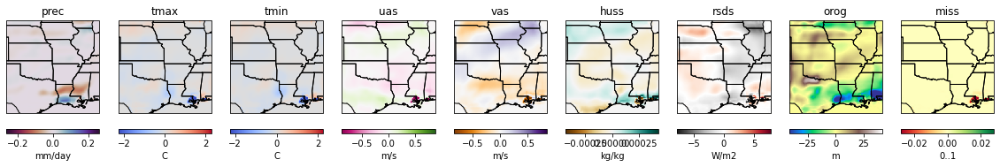

var, filter, err(var[ii]), tot_err: 5 323 6.92 1.59
[0.435, 0.411, 7.4e-05, 0.406, 9.97, 6.92, 0.876, 0.724, 0.0112, 0.127, 0.116, 0.0815, 0.107, 4.75e-05, 1.06, 7.32, 0.000614, 0.00213]


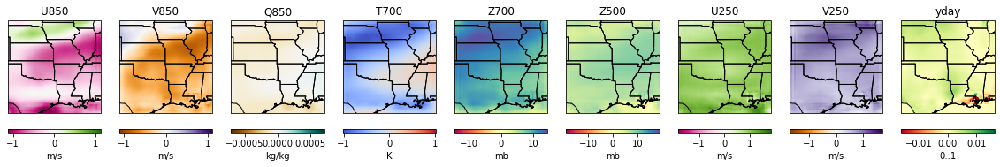

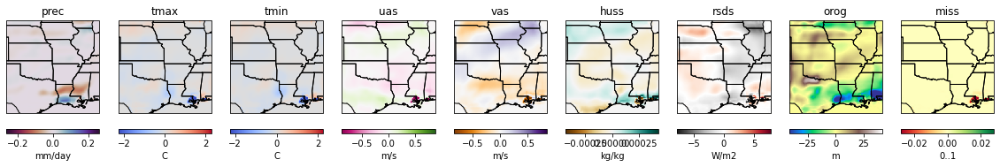

var, filter, err(var[ii]), tot_err: 6 323 0.876 1.59
[0.435, 0.411, 7.4e-05, 0.406, 9.97, 6.92, 0.876, 0.724, 0.0112, 0.127, 0.116, 0.0815, 0.107, 4.75e-05, 1.06, 7.32, 0.000614, 0.00213]


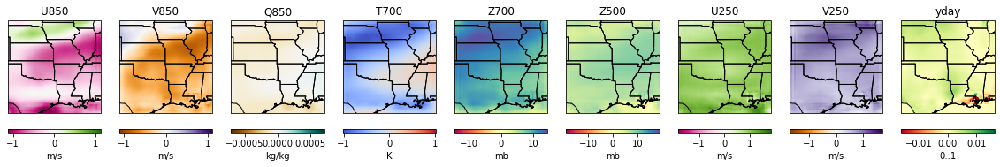

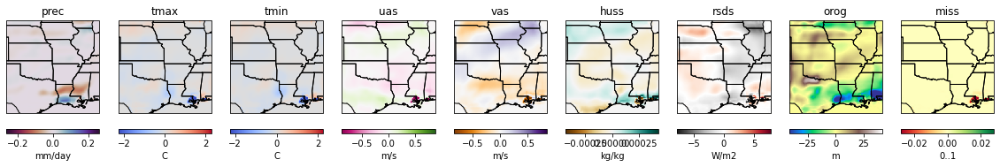

var, filter, err(var[ii]), tot_err: 7 15 1.27 1.55
[0.209, 0.327, 0.000121, 0.263, 4.42, 6.77, 0.86, 1.27, 0.01, 0.188, 0.194, 0.0793, 0.0601, 7.36e-05, 1.55, 11.7, 0.000727, 0.00251]


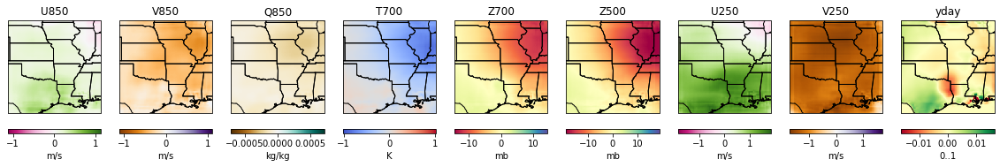

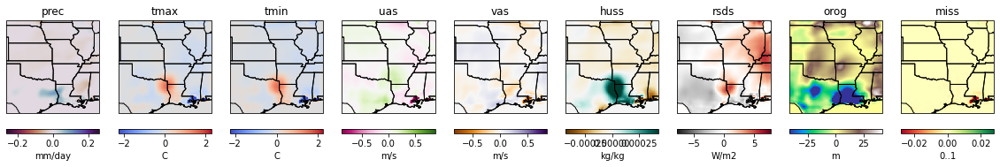

var, filter, err(var[ii]), tot_err: 8 72 0.088 0.411
[0.0725, 0.0825, 4.43e-05, 0.0358, 0.539, 0.607, 0.122, 0.147, 0.088, 0.227, 0.127, 0.0971, 0.105, 0.000111, 1.06, 4.09, 0.00042, 0.00185]


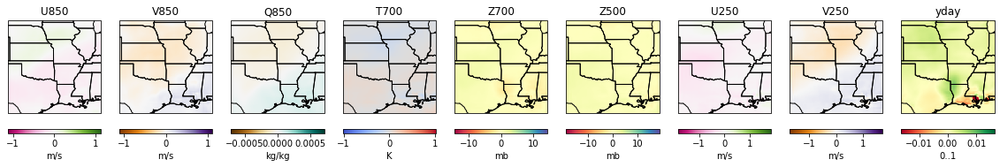

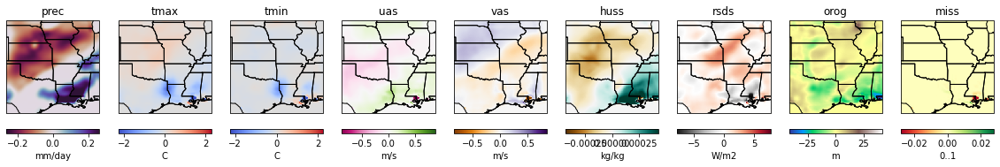

var, filter, err(var[ii]), tot_err: 9 72 0.227 0.411
[0.0725, 0.0825, 4.43e-05, 0.0358, 0.539, 0.607, 0.122, 0.147, 0.088, 0.227, 0.127, 0.0971, 0.105, 0.000111, 1.06, 4.09, 0.00042, 0.00185]


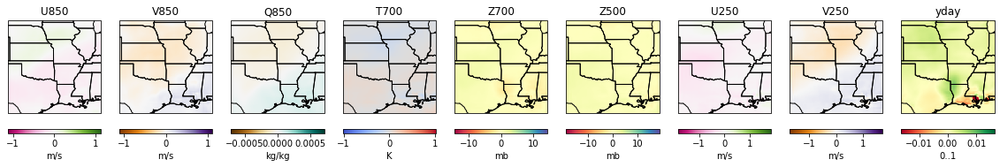

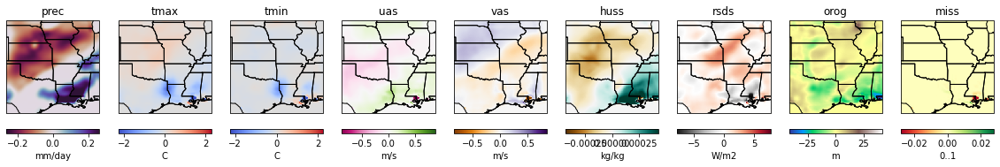

var, filter, err(var[ii]), tot_err: 10 151 0.243 0.691
[0.388, 0.305, 0.00026, 0.114, 0.815, 0.809, 0.133, 0.235, 0.0123, 0.224, 0.243, 0.0823, 0.0837, 0.000158, 1.22, 7.77, 0.00038, 0.00114]


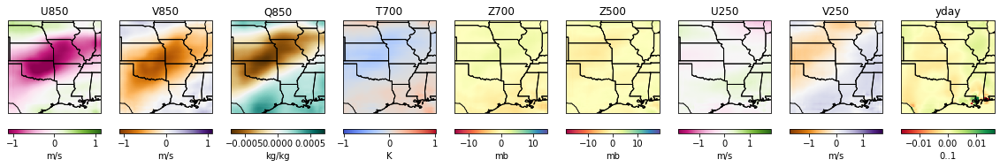

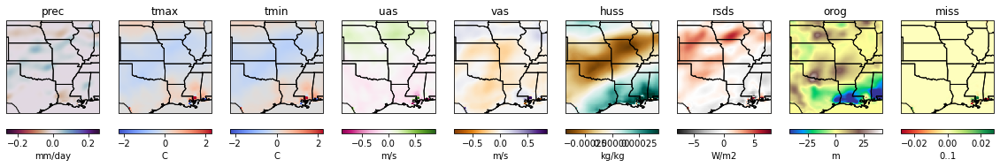

var, filter, err(var[ii]), tot_err: 11 220 0.106 0.234
[0.019, 0.0361, 1.32e-05, 0.0171, 0.197, 0.258, 0.0481, 0.0691, 0.00458, 0.097, 0.0757, 0.106, 0.0768, 3.58e-05, 0.362, 2.85, 0.000236, 0.000634]


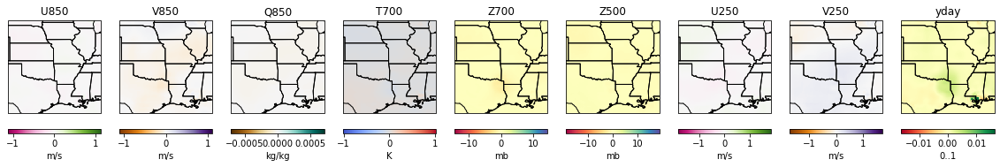

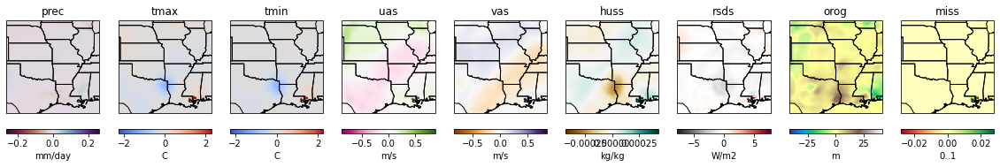

var, filter, err(var[ii]), tot_err: 12 104 0.171 0.378
[0.0819, 0.0761, 2.5e-05, 0.055, 0.505, 0.751, 0.137, 0.0927, 0.00793, 0.0816, 0.0816, 0.052, 0.171, 5.57e-05, 0.745, 3.97, 0.000113, 0.000496]


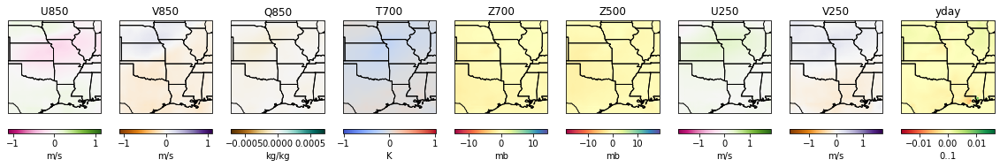

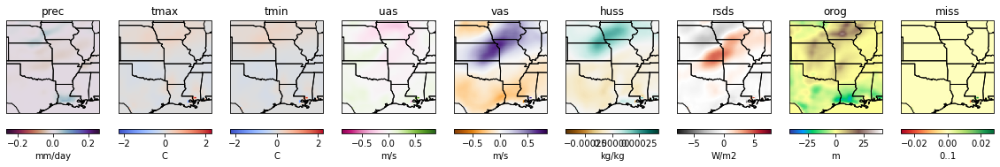

var, filter, err(var[ii]), tot_err: 13 151 0.000158 0.691
[0.388, 0.305, 0.00026, 0.114, 0.815, 0.809, 0.133, 0.235, 0.0123, 0.224, 0.243, 0.0823, 0.0837, 0.000158, 1.22, 7.77, 0.00038, 0.00114]


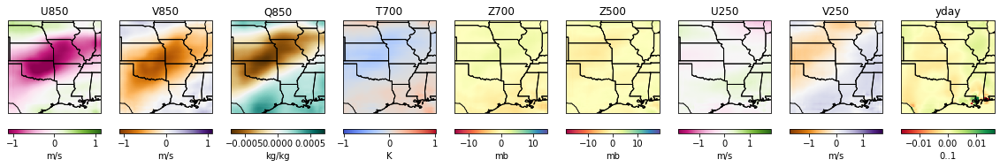

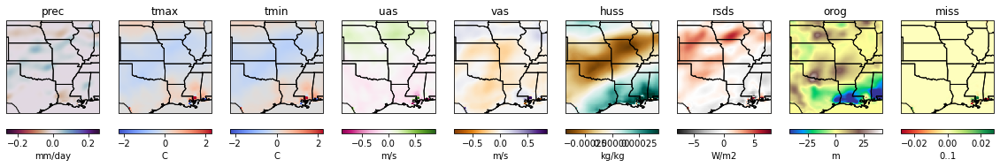

var, filter, err(var[ii]), tot_err: 14 197 2.2 0.494
[0.0263, 0.0575, 4.23e-05, 0.118, 0.584, 1.47, 0.0757, 0.173, 0.00605, 0.197, 0.176, 0.0374, 0.0339, 7.98e-05, 2.2, 3.73, 0.000426, 0.00731]


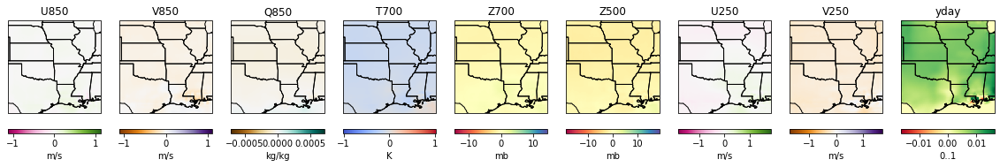

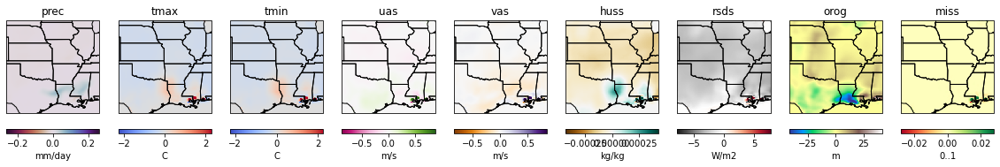

var, filter, err(var[ii]), tot_err: 15 15 11.7 1.55
[0.209, 0.327, 0.000121, 0.263, 4.42, 6.77, 0.86, 1.27, 0.01, 0.188, 0.194, 0.0793, 0.0601, 7.36e-05, 1.55, 11.7, 0.000727, 0.00251]


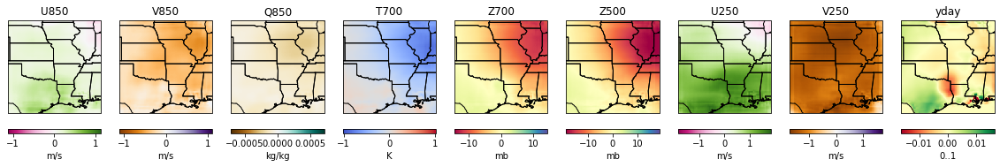

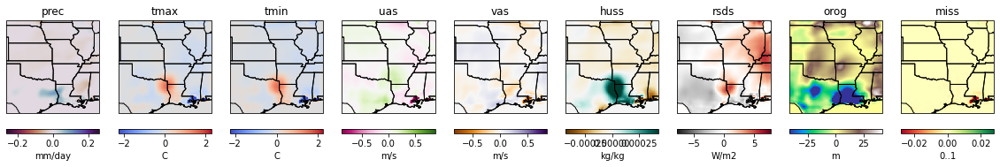

var, filter, err(var[ii]), tot_err: 16 313 0.000808 0.492
[0.05, 0.0327, 2.72e-05, 0.0529, 1.11, 1.68, 0.288, 0.223, 0.00728, 0.109, 0.103, 0.042, 0.0454, 3.23e-05, 0.593, 4.51, 0.000808, 0.00097]


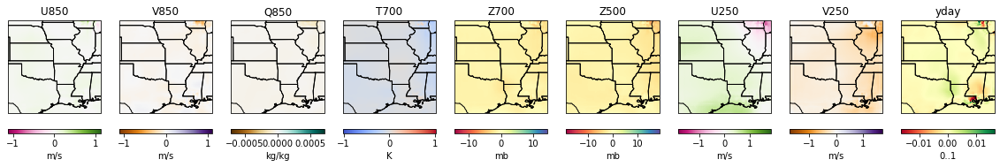

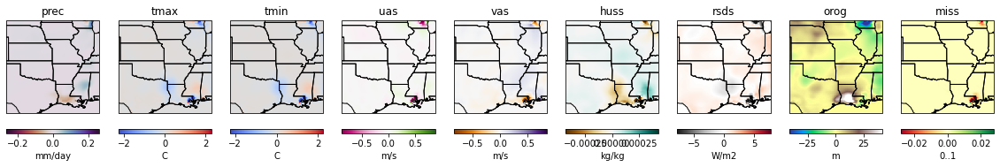

var, filter, err(var[ii]), tot_err: 17 197 0.00731 0.494
[0.0263, 0.0575, 4.23e-05, 0.118, 0.584, 1.47, 0.0757, 0.173, 0.00605, 0.197, 0.176, 0.0374, 0.0339, 7.98e-05, 2.2, 3.73, 0.000426, 0.00731]


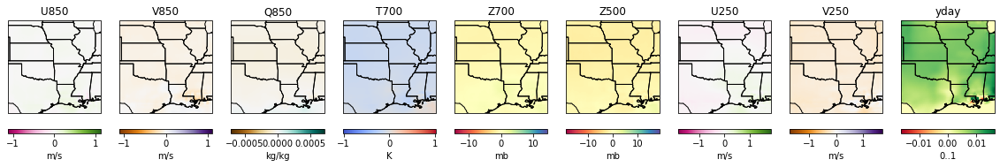

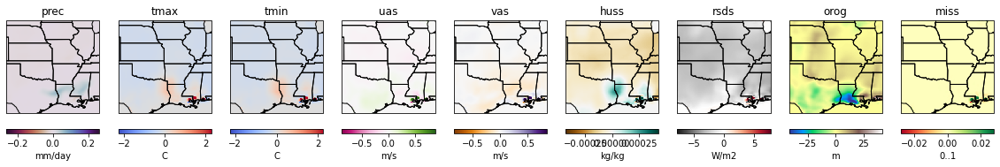

In [230]:
# Per-variable top MSE
# substituting single filters from MPI day 222 front)
for ii in range(18):
    for xx in sorted(err1_list, key=lambda x: x[1][ii], reverse=True):
        if ii == 0:

            # display headers
            vmin = [front_decoded_denorm[ii].mean() - front_decoded_denorm[ii].std()*2 for ii in range(18)]
            vmax = [front_decoded_denorm[ii].mean() + front_decoded_denorm[ii].std()*2 for ii in range(18)]

            print('front, avg, front, avg')
            svars = [0,1,2,3,4,5,6,7,17]
            plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            svars = [8,9,10,11,12,13,14,15,16]
            plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)

            #vmin = [xx[3][ii].mean() - xx[3][ii].std() for ii in range(18)]
            #vmax = [xx[3][ii].mean() + xx[3][ii].std() for ii in range(18)]
            vmax = [-9999 for y in range(18)]  
            vmin = [9999 for y in range(18)]  
            for yy in err1_list:
                vmin_temp = [yy[3][ii].mean() - yy[3][ii].std()*2 for ii in range(18)]
                vmax_temp = [yy[3][ii].mean() + yy[3][ii].std()*2 for ii in range(18)]
                #vmin_temp = [yy[3][ii].min() for ii in range(18)]
                #vmax_temp = [yy[3][ii].max() for ii in range(18)]
                vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
                vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
           
        display(HTML('<hr style="height:2px">'))
        print('var, filter, err(var[ii]), tot_err:', ii, xx[2], xx[1][ii], round_sig(xx[0]))
        print(xx[1])
        #svars=[8,9,10,11,12,13,14,15]
        #plot_8v_abs_surf_192x256(xx[3], 'Surf: deviation from bottle neck mean (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)

        svars = [0,1,2,3,4,5,6,7,17]
        #plot_9v_192x256(xx[3], 'UATM: Raw MPI', vmin, vmax, svars=svars, cc=False)
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        svars = [8,9,10,11,12,13,14,15,16]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)

        ii += 1
        if ii >= 1:
            break    

front, avg, front, avg


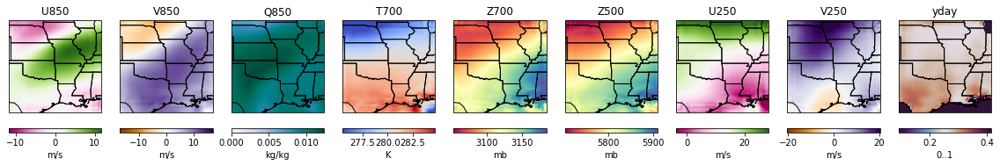

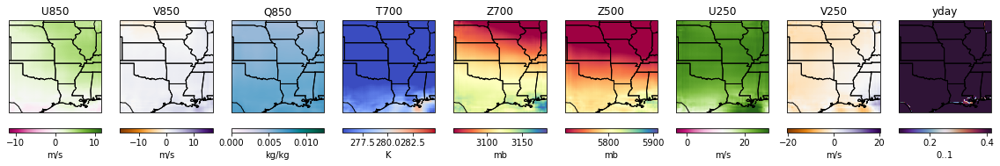

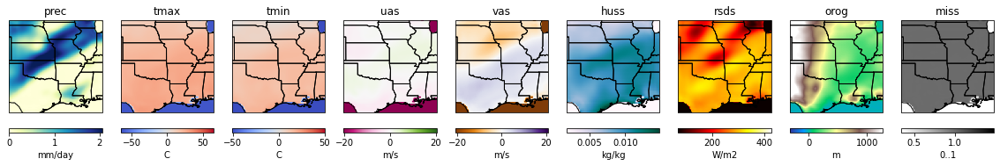

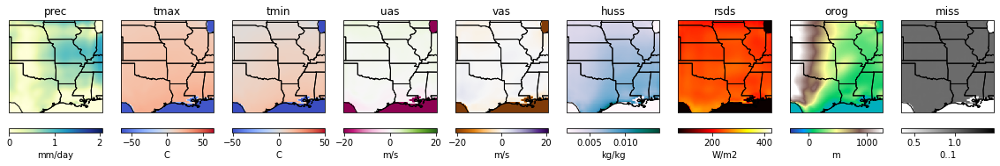

var, filter, err(var[ii]), tot_err: 0 323 0.284 1.29
[0.284, 0.429, 7.11e-05, 0.344, 7.89, 5.39, 1.05, 0.676, 0.028, 0.151, 0.123, 0.102, 0.148, 4.38e-05, 1.28, 5.32, 0.000733, 0.00166]


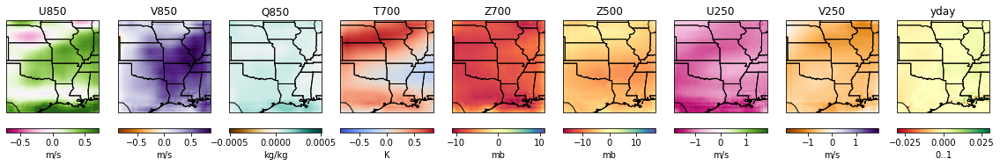

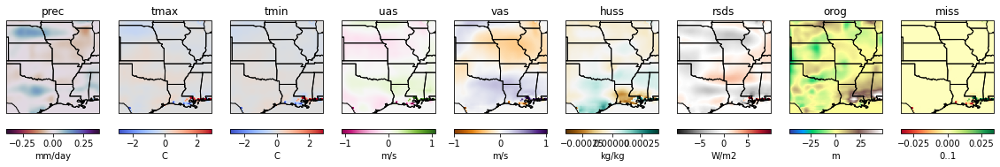

var, filter, err(var[ii]), tot_err: 1 323 0.429 1.29
[0.284, 0.429, 7.11e-05, 0.344, 7.89, 5.39, 1.05, 0.676, 0.028, 0.151, 0.123, 0.102, 0.148, 4.38e-05, 1.28, 5.32, 0.000733, 0.00166]


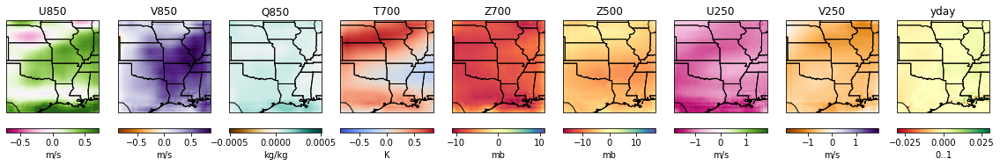

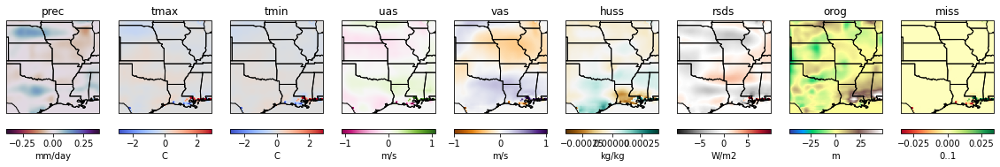

var, filter, err(var[ii]), tot_err: 2 222 0.000214 0.426
[0.0709, 0.0718, 0.000214, 0.0995, 0.668, 1.0, 0.466, 0.113, 0.011, 0.0812, 0.0673, 0.0675, 0.0454, 1.93e-05, 0.546, 4.36, 0.000293, 0.00163]


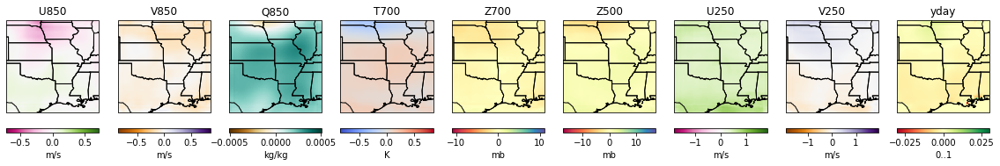

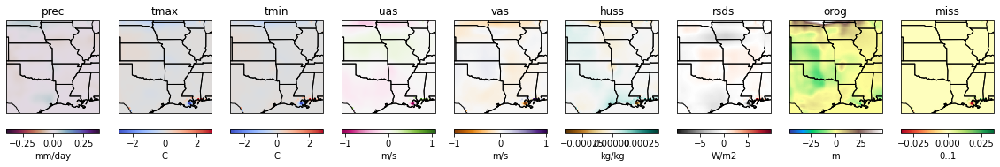

var, filter, err(var[ii]), tot_err: 3 323 0.344 1.29
[0.284, 0.429, 7.11e-05, 0.344, 7.89, 5.39, 1.05, 0.676, 0.028, 0.151, 0.123, 0.102, 0.148, 4.38e-05, 1.28, 5.32, 0.000733, 0.00166]


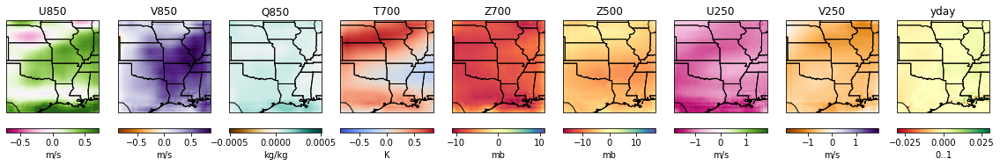

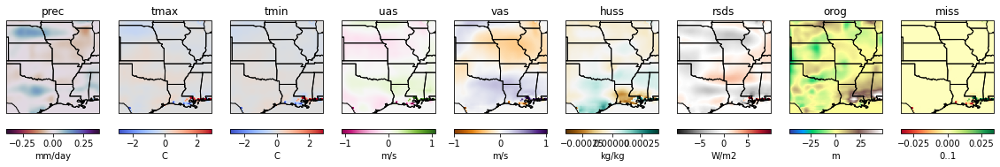

var, filter, err(var[ii]), tot_err: 4 323 7.89 1.29
[0.284, 0.429, 7.11e-05, 0.344, 7.89, 5.39, 1.05, 0.676, 0.028, 0.151, 0.123, 0.102, 0.148, 4.38e-05, 1.28, 5.32, 0.000733, 0.00166]


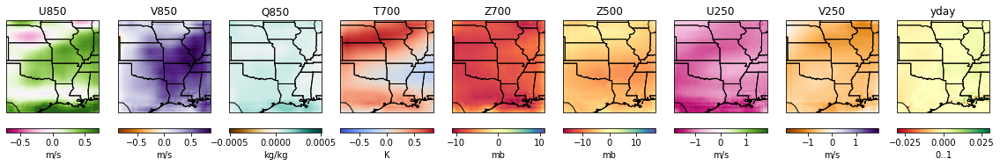

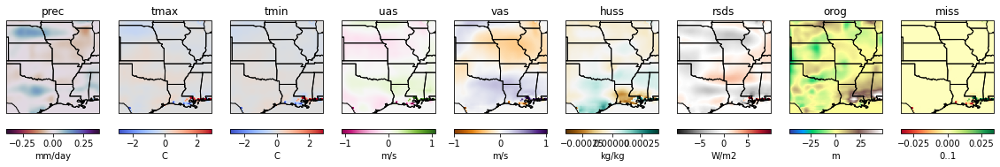

var, filter, err(var[ii]), tot_err: 5 15 6.82 1.44
[0.165, 0.396, 9.15e-05, 0.305, 4.16, 6.82, 0.855, 1.58, 0.0162, 0.201, 0.199, 0.111, 0.105, 5.76e-05, 1.09, 9.88, 0.00125, 0.00289]


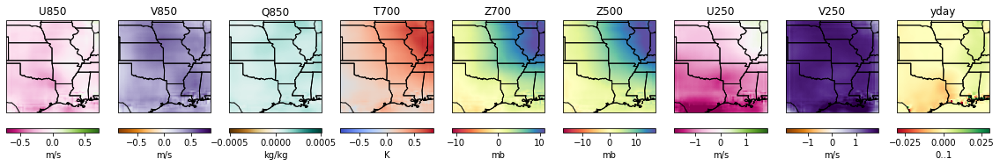

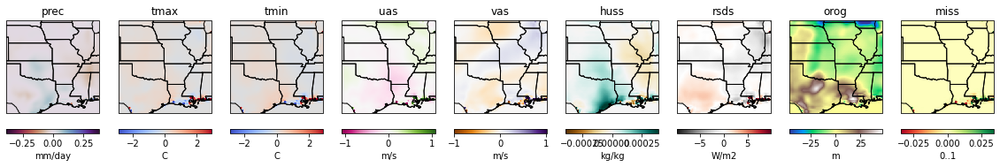

var, filter, err(var[ii]), tot_err: 6 323 1.05 1.29
[0.284, 0.429, 7.11e-05, 0.344, 7.89, 5.39, 1.05, 0.676, 0.028, 0.151, 0.123, 0.102, 0.148, 4.38e-05, 1.28, 5.32, 0.000733, 0.00166]


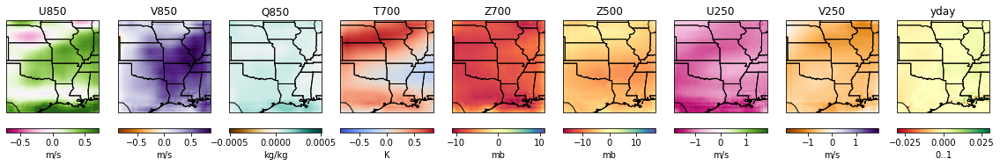

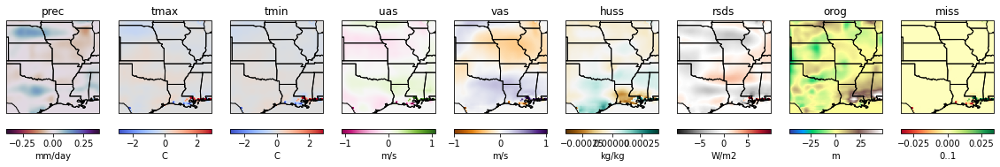

var, filter, err(var[ii]), tot_err: 7 15 1.58 1.44
[0.165, 0.396, 9.15e-05, 0.305, 4.16, 6.82, 0.855, 1.58, 0.0162, 0.201, 0.199, 0.111, 0.105, 5.76e-05, 1.09, 9.88, 0.00125, 0.00289]


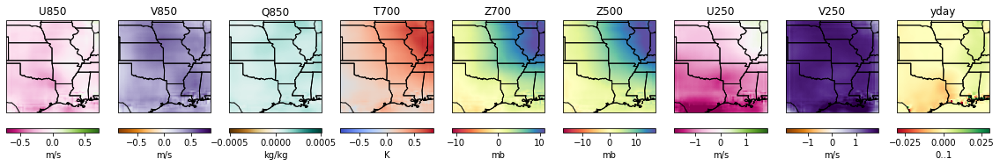

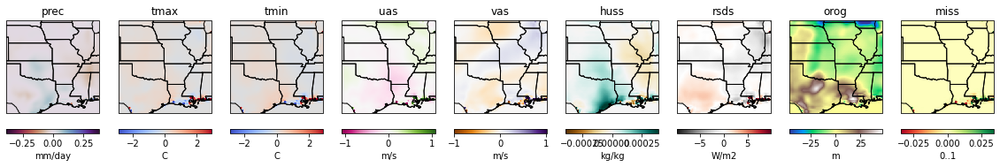

var, filter, err(var[ii]), tot_err: 8 72 0.134 0.472
[0.0642, 0.0496, 4.78e-05, 0.038, 0.424, 0.615, 0.109, 0.141, 0.134, 0.144, 0.147, 0.102, 0.15, 0.000103, 1.67, 4.69, 0.000436, 0.002]


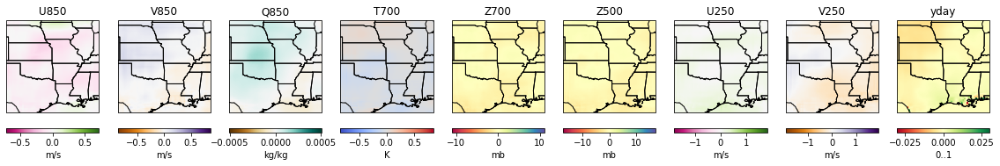

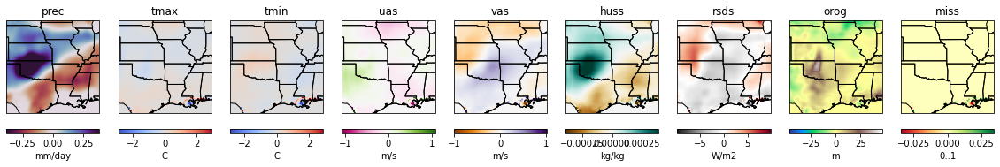

var, filter, err(var[ii]), tot_err: 9 197 0.429 0.647
[0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]


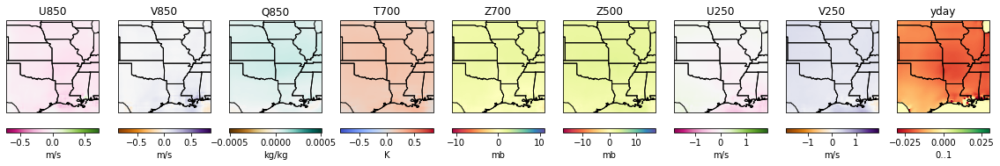

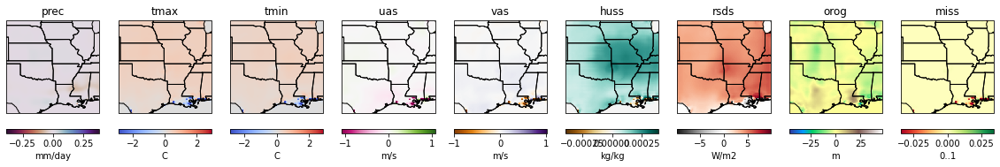

var, filter, err(var[ii]), tot_err: 10 197 0.354 0.647
[0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]


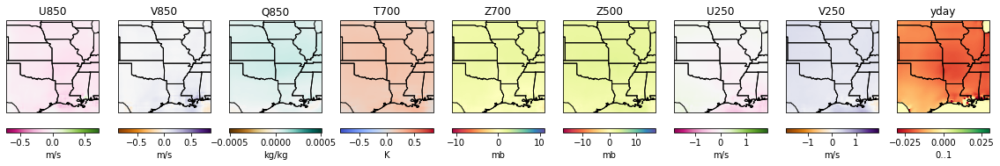

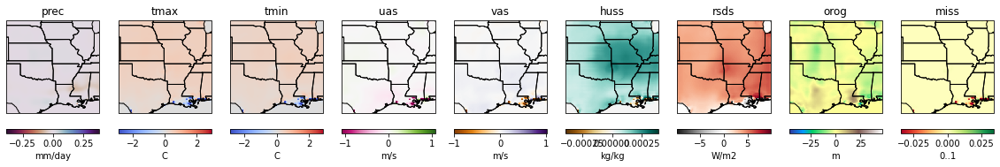

var, filter, err(var[ii]), tot_err: 11 220 0.128 0.24
[0.0187, 0.0304, 1.53e-05, 0.0147, 0.216, 0.235, 0.0413, 0.0424, 0.0132, 0.0876, 0.0775, 0.128, 0.103, 3.66e-05, 0.475, 2.84, 0.000456, 0.000909]


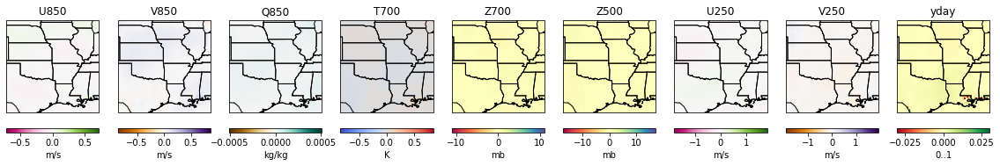

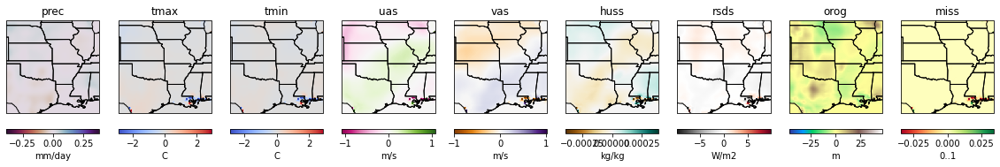

var, filter, err(var[ii]), tot_err: 12 104 0.183 0.293
[0.0251, 0.0397, 1.19e-05, 0.0314, 0.323, 0.473, 0.0742, 0.0937, 0.0147, 0.0996, 0.0989, 0.0498, 0.183, 4.08e-05, 0.854, 2.91, 0.000207, 0.000751]


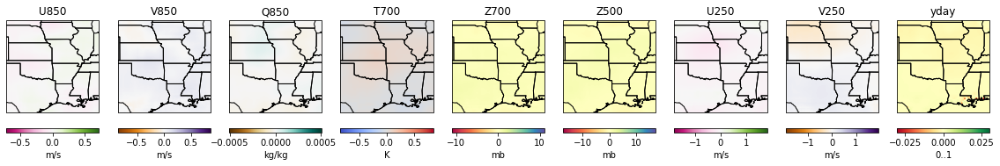

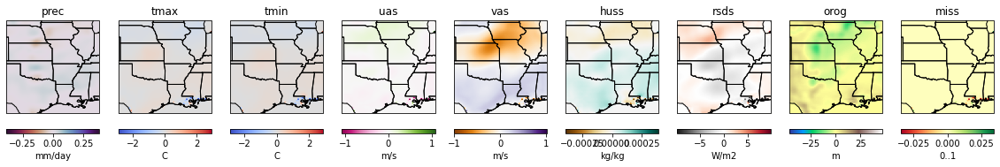

var, filter, err(var[ii]), tot_err: 13 197 0.000139 0.647
[0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]


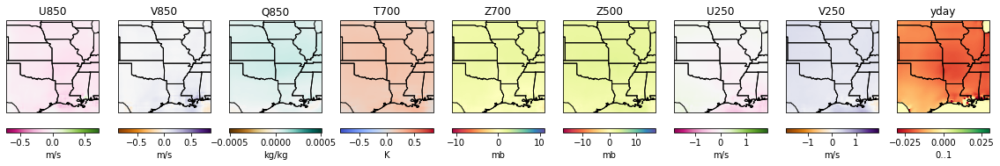

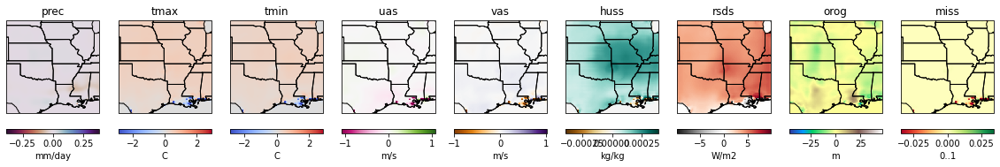

var, filter, err(var[ii]), tot_err: 14 197 3.97 0.647
[0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]


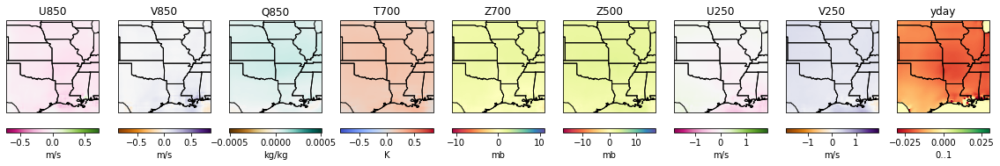

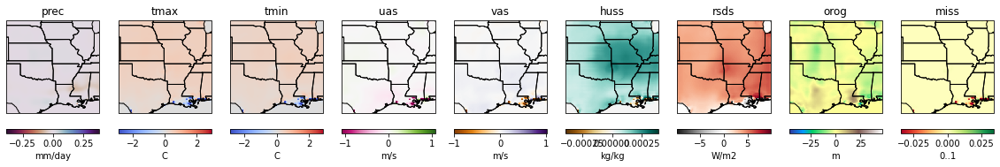

var, filter, err(var[ii]), tot_err: 15 355 12.6 0.767
[0.0297, 0.0253, 6.62e-06, 0.0264, 0.152, 0.261, 0.028, 0.0416, 0.00476, 0.0778, 0.0622, 0.0375, 0.0262, 1.79e-05, 0.417, 12.6, 0.000237, 0.000667]


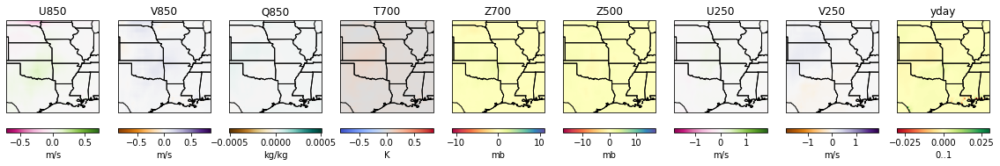

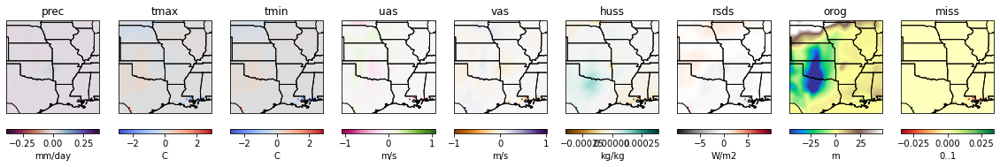

var, filter, err(var[ii]), tot_err: 16 15 0.00125 1.44
[0.165, 0.396, 9.15e-05, 0.305, 4.16, 6.82, 0.855, 1.58, 0.0162, 0.201, 0.199, 0.111, 0.105, 5.76e-05, 1.09, 9.88, 0.00125, 0.00289]


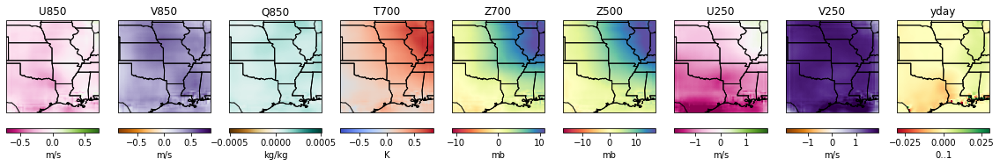

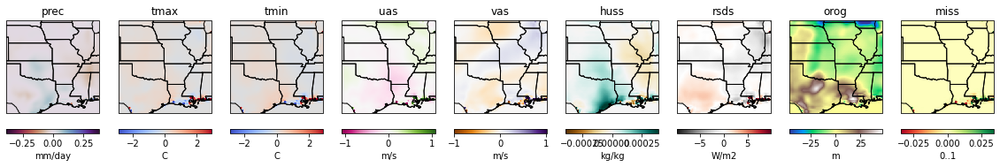

var, filter, err(var[ii]), tot_err: 17 197 0.0156 0.647
[0.0933, 0.0334, 5.58e-05, 0.178, 1.1, 2.51, 0.0844, 0.242, 0.00783, 0.429, 0.354, 0.044, 0.0425, 0.000139, 3.97, 2.55, 0.00068, 0.0156]


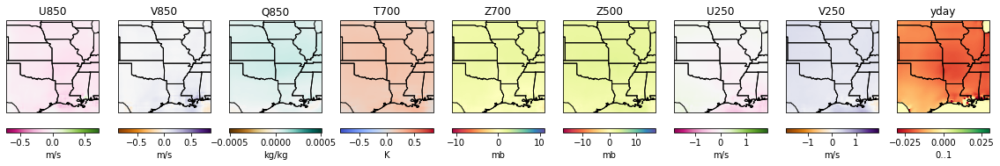

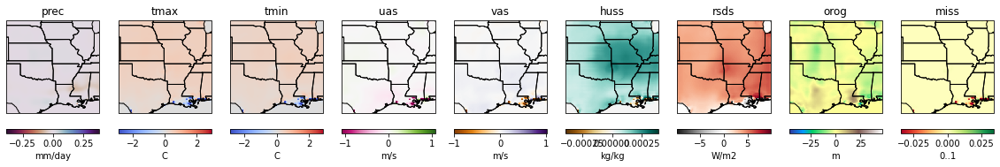

In [231]:
# Per-variable top MSE
# Deviation from front: substituting single filters [into anomaly day] from bottleneck mean
for ii in range(18):
    for xx in sorted(err2_list, key=lambda x: x[1][ii], reverse=True):
        if ii == 0:

            # display headers
            vmin = [front_decoded_denorm[ii].mean() - front_decoded_denorm[ii].std()*2 for ii in range(18)]
            vmax = [front_decoded_denorm[ii].mean() + front_decoded_denorm[ii].std()*2 for ii in range(18)]

            print('front, avg, front, avg')
            svars = [0,1,2,3,4,5,6,7,17]
            plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            svars = [8,9,10,11,12,13,14,15,16]
            plot_9v_192x256_abs(front_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)
            plot_9v_192x256_abs(avg_decoded_denorm, None, vmin, vmax, svars=svars, xoff=110, yoff=58)

            #vmin = [xx[3][ii].mean() - xx[3][ii].std() for ii in range(18)]
            #vmax = [xx[3][ii].mean() + xx[3][ii].std() for ii in range(18)]
            vmax = [-9999 for y in range(18)]  
            vmin = [9999 for y in range(18)]  
            for yy in err2_list:
                vmin_temp = [yy[3][ii].mean() - yy[3][ii].std()*2 for ii in range(18)]
                vmax_temp = [yy[3][ii].mean() + yy[3][ii].std()*2 for ii in range(18)]
                #vmin_temp = [yy[3][ii].min() for ii in range(18)]
                #vmax_temp = [yy[3][ii].max() for ii in range(18)]
                vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
                vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
           
        display(HTML('<hr style="height:2px">'))
        print('var, filter, err(var[ii]), tot_err:', ii, xx[2], xx[1][ii], round_sig(xx[0]))
        print(xx[1])
        #svars=[8,9,10,11,12,13,14,15]
        #plot_8v_abs_surf_192x256(xx[3], 'Surf: deviation from bottle neck mean (mpi2mpi)', vmin, vmax, svars=svars, xoff=64, yoff=64)

        svars = [0,1,2,3,4,5,6,7,17]
        #plot_9v_192x256(xx[3], 'UATM: Raw MPI', vmin, vmax, svars=svars, cc=False)
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)
        svars = [8,9,10,11,12,13,14,15,16]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=110, yoff=58)

        ii += 1
        if ii >= 1:
            break   